<a href="https://colab.research.google.com/github/sanam2226/Dog-Vision-playon-computer-vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multi-class Dog Breed Classification

*(Author: Ajay Pillai using TensorFlow with GPUs and/or TPUs)* 

This notebook builds an end-to-end multi-calls impage classifier using TensorFlow 2.12.x and FensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog. When I'm sitting at the cafe and take a photo of a dog, I want to know what breed of dof it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification completion

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

Submissions are evaluated on Multi Class Log Loss between teh predicted probability and the observed target. For each image in the test set, you must predict a probability for each of the different breeds. The file should contain a header and have a particular format.

## Features

Some information about the data
* We're dealing with images (unstructured data)so it's probably best we use deep learning/ transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There around 10,000+ images in the training set (these images have labels)
* There around 10,000+ images in the test set (these images dont have labels, because we'll want to predict them).


In [ ]:
# Import TensorFlow into Colab

In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"

### Get our workspace ready

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF Version:", tf.__version__)

TF Version: 2.12.0


* Import TensorFlow Hub
* Make sure we're using a GPU:

In [ ]:
import tensorflow_hub as hub

In [ ]:
print("TF Hub version:", hub.__version__)

TF Hub version: 0.13.0


In [ ]:
# Check for GPU availability
print("GPU", "available (YESSSSS !!!!!)" if tf.config.list_physical_devices("GPU") else "not available: ")

GPU available (YESSSSS !!!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors.

Let's start by accessing our data and checking out the labels

In [ ]:
# Check the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


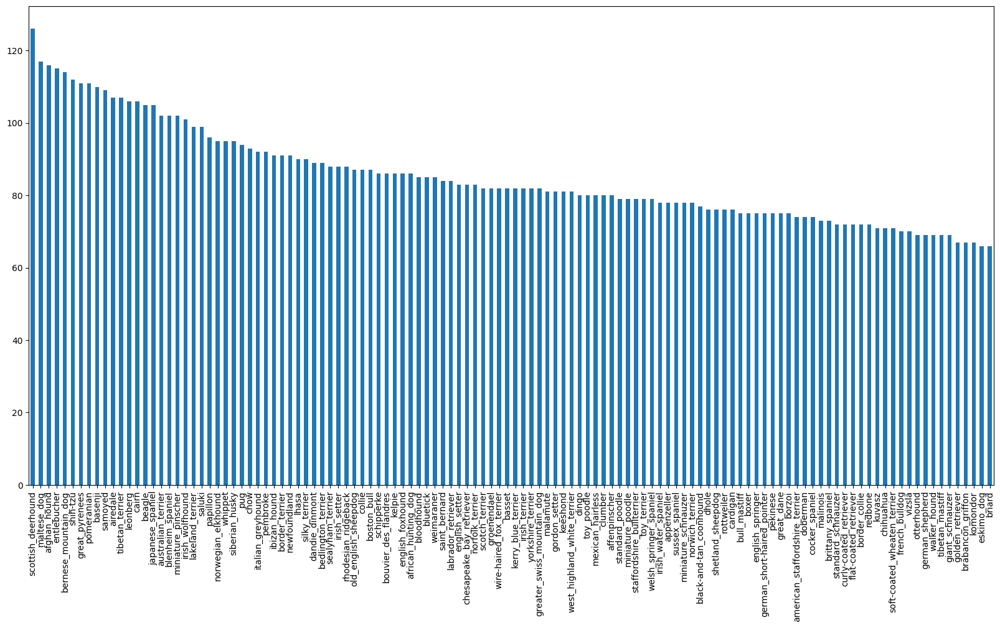

In [ ]:
# How many images are there for each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

### Hello to my dog TinTin. He is a sweetie !!!

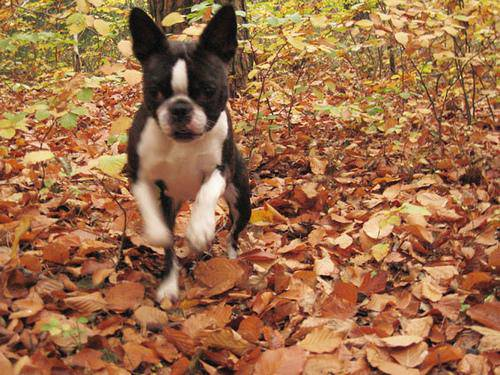

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")
#Image("/content/drive/MyDrive/Dog Vision/test/000621fb3cbb32d8935728e48679680e.jpg")
#Image("/content/drive/MyDrive/Dog Vision/my-dog-photos/dog-photo.jpg")

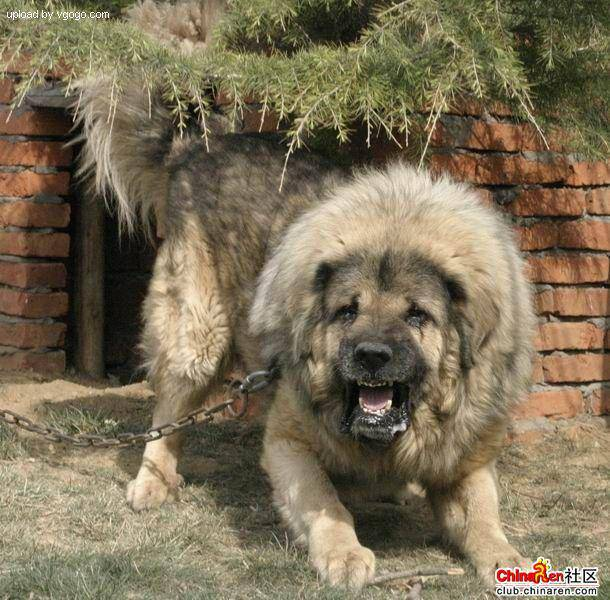

In [ ]:
Image(filenames[9000]) # Another random dog image - ferocious

### Getting images and their labels

Let's get a list of all of our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames for image ID's
filenames = ["/content/drive/MyDrive/Dog Vision/train/"+fname+".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:50]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/drive/MyDrive/Dog

In [ ]:
# Compare with the number of files under the training folder to make sure we are working with the same number of data
import os
#os.chdir("/content/drive/MyDrive/Dog Vision/train/")
if len(os.listdir("/content/drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files !!! Proceed.")
else:
 print("Filenames do not match actual amount of files, check the target directory")
 

Filenames match actual amount of files !!! Proceed.


In [ ]:
len(filenames)

10222

In [ ]:
# One more check
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See of the number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of label matches number of filenames")
else:
  print("Number of labels does not match number of filename, check data directories !")

Number of label matches number of filenames


In [ ]:
# Find unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Lets do this for everysingle label into a boolean array

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0]))  # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
len(filenames)

10222

In [ ]:
# Create our own validation set
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

In [ ]:
len(X), len(y)

(10222, 10222)

We're going to start of experimenting with ~ 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
#Let's split our data into train and validation
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_INAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

In [ ]:
#Let's have a gaze
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing Images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file ansd save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image(convert color channel from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do let's see what importing an image looks like



In [ ]:
# Convert an image to a NumPy array 
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Define image size
IMG_SIZE = 224


# Create a function for preprocessing images

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """

  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image to numeric tensor with 3 color channels (R,G, B)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert the color channel values from 0-255 to 0-1 values [Normalization makes processing more efficient]
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
# Converting the image to a tensor. The diff is that Tensor runs on GPU and approx 30 x faster
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

### 32 is the default batch size for Tensor - Read yann lecun, jeremy howard batch size post
## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go ... they all might not fit into memory. 

So that's why we do about 32 (images batch size which can be manually adjusted if need be)

In order to use TensorFlow effectively we need our data in the form of Tensor tuples which looks like this:(`image, label`)



In [ ]:
# create simple function to return a tuple(image, label)
def get_image_label(image_path, label):

  """
  Takes an imapge file path name and the associated label process the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)

  return image, label

Now we've gpt a way to turn our data into tuples of Tensors in the form : `(image, label)`, let's make a function to turn all of our data (`X` and `y`) into batches!


In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image(x) and label(y) pairs.
  It shuffles the data if it's training data but doesnt shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """

  # if the data is a test dataset , we probably don't have labels
  if test_data:
    print("Creating test data batches ...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches ...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y))) #  filepaths and labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If the data is a training dataset, we need to shuffle it
  else:
    print("Creating training data batches ...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y))) #  filepaths and labels
    # Shuffling 
    data = data.shuffle(buffer_size=len(x))
    data = data.map(get_image_label)


    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
   
    return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches ...
Creating validation data batches ...


In [ ]:
# Check out the different attributes pf our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")



## Visualizing Our Data Batches

To make computation efficient, a batch is a tighly wound collection of Tensors.

So to view data in a batch, we've got to unwind it.

We can do so by calling the `as_numpy_iterator()` method on a data batch.

This will turn our a data batch into something which can be iterated over.

Passing an iterable to `next()` will return the next item in the iterator.

In our case, next will return a batch of 32 images and label pairs.

**Note:** Running the cell below and loading images may take a little while.

In [ ]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())

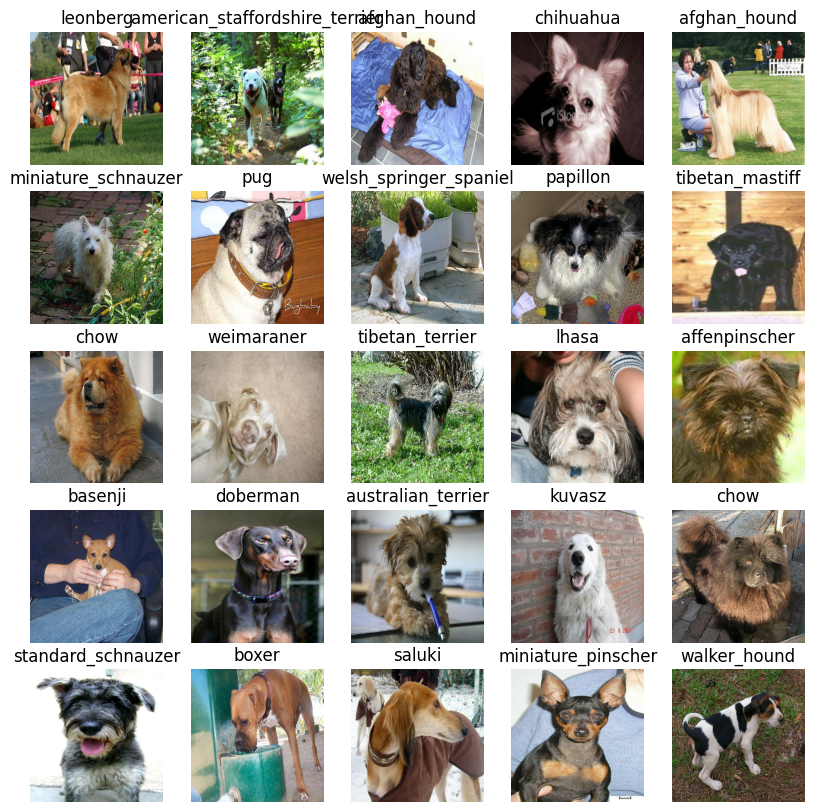

In [ ]:
show_25_images(train_images, train_labels)

Look at all those beautiful dogs!

**Question:** Rerun the cell above, why do you think a different set of images is displayed each time you run it?

In [ ]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())


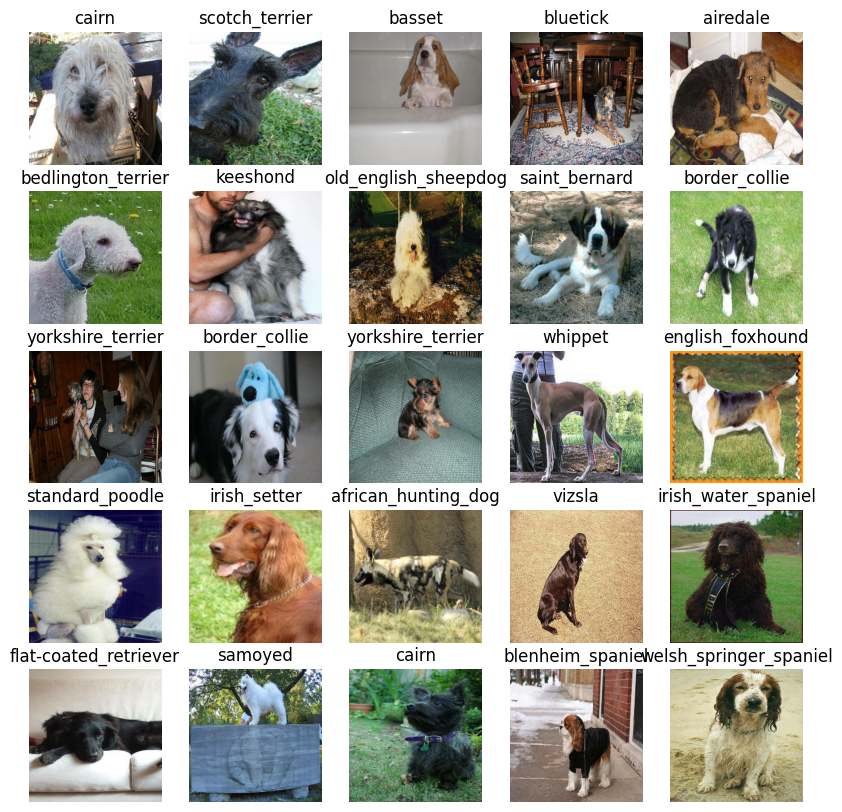

In [ ]:
show_25_images(val_images, val_labels)

## Creating and training a model

Now our data is ready, let's prepare it modelling. We'll use an existing model from https://tfhub.dev/

TensorFlow Hub is a resource where you can find pretrained machine learning models for the problem you're working on.

Using a pretrained machine learning model is often referred to as **transfer learning.**


**Why use a pretrained model?**
Building a machine learning model and training it on lots from scratch can be expensive and time consuming.

Transfer learning helps eliviate some of these by taking what another model has learned and using that information with your own problem.

** How do you choose a model?**

Since we know our problem is image classification (classifying different dog breeds), we can navigate the TensorFlow Hub page by our problem domain (image).

We start by choosing the image problem domain, and then can filter it down by subdomains, in our case, image classification.

Doing this gives a list of different pretrained models we can apply to our task.

Clicking on one gives us information about the model as well as instructions for using it.

For example, clicking on the mobilenet_v2_140_224 model, tells us this model takes an input of images in the shape 224, 224. It also says the model has been trained in the domain of image classification.

Let's try it out.


## Building a model

Before we build a model, there are a few things we need to define:

1. The input shape (images, in the form of Tensors) to our model.
1. The output shape (image labels, in the form of Tensors) of our model.
3. The URL of the model we want to use.
These things will be standard practice with whatever machine learning model you use. And because we're using TensorFlow, everything will be in the form of Tensors.














In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5"


Now we've got the inputs and models we're using ready to go. We can start putting it altogther. We will use the Keras API 

Defining a deep learning model in Keras can be as straightforward as saying, "here are the layers of the model, the input shape and the output shape, let's go!"

Knowing this, let's create a function which:

1. Takes the input shape, output shape and the model we've chosen's URL as parameters.
2. Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
3. Compiles the model (says how it should be evaluated and improved).
4. Builds the model (tells it what kind of input shape it'll be getting).
5. Returns the model.
We'll take a look at the code first, then dicuss each part.



In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              6158505   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 6,278,745
Trainable params: 120,240
Non-trainable params: 6,158,505
_________________________________________________________________


### Creating callbacks

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

### TensorBoard Callback

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize the our models training logs using the %tensorboard magic function (we'll do this later on).


### Early Stopping

Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment 
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


In [ ]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## Training a model (on subset of data)

Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.


In [ ]:
NUM_EPOCHS = 20#@param {type:"slider", min:10, max:100, step:10}


In [ ]:
# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices ("GPU")  else "not available :(")

GPU available (YESS!!!!)


* Create a model using `create_model()`.
* Setup a TensorBoard callback using `create_tensorboard_callback()` (we do this here so it creates a log directory of the current date and time).
* Call the `fit()` function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Epoch 1/20
25/25 [==============================] - 147s 5s/step - loss: 4.5248 - accuracy: 0.1175 - val_loss: 3.4419 - val_accuracy: 0.2350
Epoch 2/20
25/25 [==============================] - 2s 68ms/step - loss: 1.6342 - accuracy: 0.6950 - val_loss: 2.2004 - val_accuracy: 0.4900
Epoch 3/20
25/25 [==============================] - 2s 69ms/step - loss: 0.5636 - accuracy: 0.9438 - val_loss: 1.7068 - val_accuracy: 0.5950
Epoch 4/20
25/25 [==============================] - 2s 77ms/step - loss: 0.2472 - accuracy: 0.9937 - val_loss: 1.5193 - val_accuracy: 0.6200
Epoch 5/20
25/25 [==============================] - 2s 68ms/step - loss: 0.1395 - accuracy: 1.0000 - val_loss: 1.4545 - val_accuracy: 0.6350
Epoch 6/20
25/25 [==============================] - 2s 76ms/step - loss: 0.0960 - accuracy: 1.0000 - val_loss: 1.3928 - val_accuracy: 0.6600
Epoch 7/20
25/25 [==============================] - 2s 80ms/s

### Checking the TensorBoard logs

Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and viualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluation predictions using a trained model


Before we scale up and train on more data, let's see some other ways we can evaluate our model. Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action.

Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 1s 68ms/step


array([[1.85039570e-03, 2.88115931e-03, 7.02730322e-04, ...,
        1.03615901e-04, 5.44080613e-05, 1.89757979e-04],
       [6.40129088e-04, 1.67557457e-03, 1.29582500e-03, ...,
        6.70659472e-04, 1.76465278e-03, 8.51462304e-04],
       [9.41739586e-07, 2.40285754e-05, 2.32438961e-05, ...,
        6.06321155e-05, 4.92872368e-06, 6.59455982e-05],
       ...,
       [7.78335743e-06, 2.21203532e-04, 2.96630402e-04, ...,
        4.35960828e-05, 3.51414928e-05, 5.50348777e-05],
       [1.30164655e-04, 1.36613116e-05, 3.29066715e-05, ...,
        6.13265584e-05, 4.58912291e-05, 4.11783200e-04],
       [7.53758301e-04, 1.08515669e-05, 8.32072517e-04, ...,
        1.10510895e-02, 8.83185829e-04, 2.92749726e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

Making predictions with our model returns an array with a different value for each label.

In this case, making predictions on the validation data (200 images) returns an array `(predictions)` of arrays, each containing 120 different values (one for each unique dog breed).

These different values are the probabilities or the likelihood the model has predicted a certain image being a certain breed of dog. The higher the value, the more likely the model thinks a given image is a specific breed of dog.

Let's see how we'd convert an array of probabilities into an actual label.

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[index])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[index])}") # the index of where the max value in predictions[index] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}") # the predicted label

[6.90035886e-05 8.56478364e-05 8.34887760e-05 1.49616695e-04
 2.55834777e-04 1.23795049e-04 3.12097953e-04 2.23294203e-03
 7.05102682e-02 3.05526257e-02 2.50747617e-05 3.61272214e-05
 2.13865816e-04 2.47220020e-03 1.43322919e-03 2.87976139e-03
 9.31676768e-05 2.63948168e-04 3.59709840e-04 3.89737950e-04
 9.09083639e-04 5.88172523e-04 3.61899110e-05 9.45069623e-05
 7.69632915e-03 3.09961106e-05 1.19402059e-04 5.14839339e-05
 3.18096972e-05 2.92160075e-05 6.61471713e-05 2.47711487e-05
 2.48466458e-05 7.85308875e-05 2.59105116e-04 5.71925593e-05
 6.33935124e-05 2.81265064e-04 1.34085611e-04 7.00051367e-01
 1.39995385e-03 4.74915032e-05 1.42315067e-02 4.09171735e-05
 7.24829224e-05 1.44585729e-05 1.43438256e-05 6.41098071e-04
 1.15382521e-04 1.94988141e-04 5.75600534e-05 8.05909367e-05
 2.11052742e-04 1.06368482e-03 4.56233356e-05 1.35023263e-03
 7.28452069e-05 2.88303534e-04 1.71875348e-04 1.64301266e-04
 9.91336565e-05 3.46108951e-04 2.12424638e-04 8.87230635e-06
 7.11028042e-05 6.131245

Having this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

Since our validation data `(val_data)` is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using `unbatch()`) and then turn it into an iterator using `as_numpy_iterator()`.

Let's make a small function to do so.

In [ ]:
# Create a function to unbatch a batched dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visualize.

The first function we'll create will:

* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

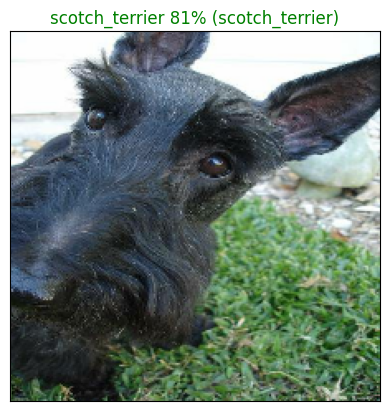

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=1)

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
** Prediction probabilities indexes
** Prediction probabilities values
** Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

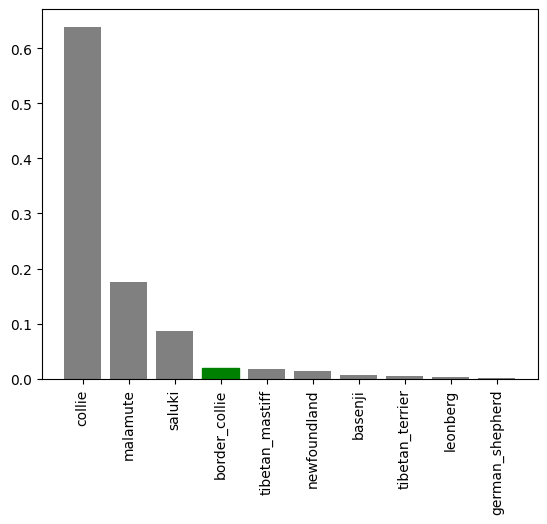

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

### Let's put the 2 functions built above and images next to it

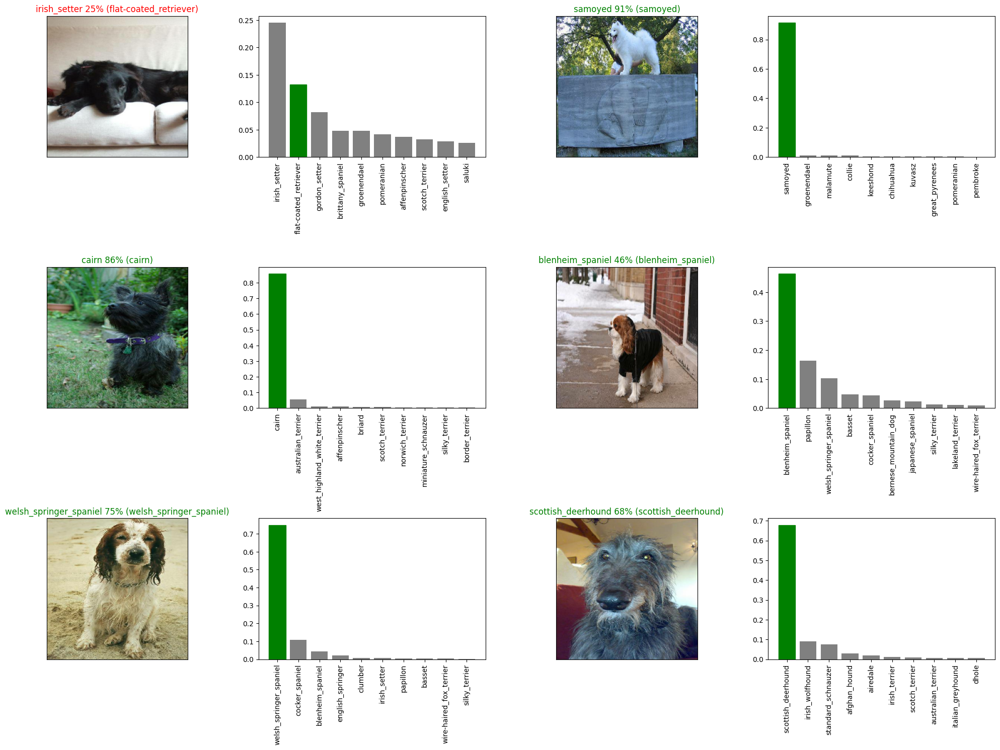

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and reloading a module

After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.

The format of an entire saved Keras model is h5. So we'll make a function which can take a model as input and utilise the `save()` method to save it as a h5 file to a specified directory.








In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

If we've got a saved model, we'd like to load it, let's create a function which can take a model path and use the `tf.keras.models.load_model()` function to load it into the notebook.

Because we're using a component from TensorFlow Hub (`hub.KerasLayer`) we'll have to pass this as a parameter to the `custom_objects` parameter.

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20230518-13471684417660-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20230518-13471684417660-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load our model trained on 1000 images
model_1000_images = load_model('/content/drive/MyDrive/Dog Vision/models/20230518-03361684381009-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20230518-03361684381009-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 0s 50ms/step - loss: 1.3061 - accuracy: 0.6700


[1.306085467338562, 0.6700000166893005]

In [ ]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 50ms/step - loss: 1.2369 - accuracy: 0.7150


[1.2369483709335327, 0.7149999737739563]

## Training a model (on the full data)

Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to X and all of the training labels to y. Let's check them out.

In [ ]:
# Remind ourselves of the size of the full dataset
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches ...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5


We'll need some callbacks

In [ ]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note** Running the cell below will take a while especially because GCP GPUs are not available on the free colab unless we go Pro. We have to use CPUs - 30x slower. This means I can stop for tonight and pick up the rest tomorrow morning hoping that Google's colab workspace doesn't crash or reconnect over night

In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/20
320/320 [==============================] - 21s 55ms/step - loss: 1.2978 - accuracy: 0.6793
Epoch 2/20
320/320 [==============================] - 17s 53ms/step - loss: 0.3657 - accuracy: 0.8908
Epoch 3/20
320/320 [==============================] - 17s 53ms/step - loss: 0.2079 - accuracy: 0.9454
Epoch 4/20
320/320 [==============================] - 17s 54ms/step - loss: 0.1298 - accuracy: 0.9727
Epoch 5/20
320/320 [==============================] - 17s 53ms/step - loss: 0.0895 - accuracy: 0.9830
Epoch 6/20
320/320 [==============================] - 17s 53ms/step - loss: 0.0642 - accuracy: 0.9908
Epoch 7/20
320/320 [==============================] - 17s 54ms/step - loss: 0.0486 - accuracy: 0.9943
Epoch 8/20
320/320 [==============================] - 17s 54ms/step - loss: 0.0381 - accuracy: 0.9964
Epoch 9/20
320/320 [==============================] - 18s 55ms/step - loss: 0.0305 - accuracy: 0.9979
Epoch 10/20
320/320 [==============================] - 17s 53ms/step - loss: 0.026

In [ ]:
# Save model to file
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/models/20230518-13581684418309-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20230518-13581684418309-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/models/20230518-13581684418309-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20230518-13581684418309-full-image-set-mobilenetv2-Adam.h5


### Making predictions on the test dataset

we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the `predict()` function.


In [ ]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "/content/drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/eac53a0ba2df1689f98f8e7f8ebb90c2.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f191370aae3cc8e282cfd72ecdcc2226.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f4eb6450497df847ef1012d61d869007.jpg',
 '/content/drive/MyDrive/Dog Vision/test/eab189c5274b79b36dd566fea4e9847e.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ede33cc93aa6dd4f7bc7fb2436026d08.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f3ea1d71874433a4fe775deb9e95923a.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ecba66c5313a2a5fd4017a039a9501b6.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f5787e3574a4af6a19ff825cf0c32366.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f3cbc8bcd54963296f75377d6fe931d3.jpg',
 '/content/drive/MyDrive/Dog Vision/test/f00b35c8f1a052d4989f17134532efb4.jpg']

In [ ]:
# How many test images are there?
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches ...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Since there are 10,000+ test images, making predictions could take a while, even on a GPU. 

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1759s 5s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", delimiter=',')

In [ ]:
test_predictions[:10]

array([[1.23139063e-08, 7.21350091e-09, 4.81833808e-07, ...,
        3.89835471e-08, 4.50789051e-09, 3.48041068e-10],
       [2.27488117e-09, 1.46678406e-06, 7.06770331e-09, ...,
        4.02741580e-06, 1.36331366e-07, 8.82882212e-10],
       [1.42124729e-04, 1.84065527e-08, 1.89346250e-09, ...,
        3.41873283e-06, 7.10832353e-08, 5.86581308e-08],
       ...,
       [3.29608525e-07, 7.58381248e-07, 5.26492659e-06, ...,
        3.07375740e-05, 1.89218401e-08, 2.35236413e-07],
       [5.60951507e-10, 1.20454217e-07, 1.01125238e-06, ...,
        7.49646802e-04, 5.81818682e-09, 5.42653162e-12],
       [1.30932296e-11, 4.38149977e-13, 1.04427111e-12, ...,
        2.40431217e-11, 1.61910871e-12, 1.86686748e-07]])

### Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submissions [https://www.kaggle.com/c/dog-breed-identification/overview/evaluation] 

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the `unique_breeds` list and the `test_predictions` list.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_path = "/content/drive/MyDrive/Dog Vision/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,eac53a0ba2df1689f98f8e7f8ebb90c2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f191370aae3cc8e282cfd72ecdcc2226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f4eb6450497df847ef1012d61d869007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,eab189c5274b79b36dd566fea4e9847e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ede33cc93aa6dd4f7bc7fb2436026d08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,eac53a0ba2df1689f98f8e7f8ebb90c2,1.231391e-08,7.213501e-09,4.818338e-07,1.607533e-10,5.868412e-07,7.878705e-07,9.540311e-09,1.025231e-04,4.362351e-04,...,8.480777e-10,1.322351e-10,1.530197e-09,1.245149e-06,1.829555e-09,1.061844e-05,4.372117e-08,3.898355e-08,4.507891e-09,3.480411e-10
1,f191370aae3cc8e282cfd72ecdcc2226,2.274881e-09,1.466784e-06,7.067703e-09,4.392463e-10,4.684110e-09,1.084099e-12,9.015197e-12,3.716766e-10,3.155292e-11,...,1.057253e-08,2.161797e-10,4.299227e-08,6.753820e-09,5.528417e-09,1.956639e-09,2.387958e-10,4.027416e-06,1.363314e-07,8.828822e-10
2,f4eb6450497df847ef1012d61d869007,1.421247e-04,1.840655e-08,1.893462e-09,2.945259e-07,1.909147e-09,3.056213e-07,3.736203e-09,1.641637e-08,4.887098e-11,...,7.040278e-08,4.532893e-13,3.496223e-08,1.917946e-09,3.048836e-09,4.230114e-12,1.852725e-09,3.418733e-06,7.108324e-08,5.865813e-08
3,eab189c5274b79b36dd566fea4e9847e,4.864072e-08,7.918604e-08,7.799794e-08,3.969051e-09,1.898575e-07,3.689662e-09,9.074117e-01,2.113490e-06,1.444017e-08,...,3.372764e-10,1.578593e-06,2.249415e-08,1.043463e-07,6.608238e-10,4.337672e-08,9.858379e-06,1.249414e-07,2.427000e-06,6.972683e-05
4,ede33cc93aa6dd4f7bc7fb2436026d08,2.443447e-10,5.687721e-11,1.834104e-10,1.051961e-06,1.190309e-08,1.983996e-05,2.888867e-09,1.668692e-09,2.745807e-10,...,8.582397e-11,2.061920e-09,1.265147e-07,1.521795e-07,1.270198e-07,1.356435e-09,1.228429e-11,5.884069e-08,1.028227e-10,9.133287e-10


In [ ]:
# Export to csv
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/data/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

### Making predictions on custom images
To make predictions on custom images, we'll:
* Get the filepaths of our images
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.
Note: To make predictions on custom images, I've uploaded pictures of my dog to the my-dog-photos folder

In [ ]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/my-dog-photos/dog-photo-1.jpg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/dog-photo.jpg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/IMG_0500.JPG']

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches ...


In [ ]:
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(3, 120)

Now we've got some predictions arrays, let's convert them to labels and compare them with each image.

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'golden_retriever', 'basenji']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels ... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

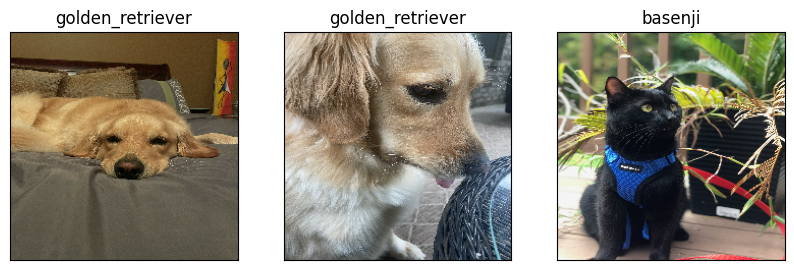

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)